# CORRECT AND IN-CORRECT MASK DETECTION


Since the wake of COVID, the world has through a wild ride, new social norms being formed; wearing mask around has become the new norm. In the web, there are tons of resources available for training a model to detetct whether a prson/group of persons are wearing a mask or not. What we found is that, there are relatively lesser number of resources that can categorize whether someone is wearing a mask corretcly or not, since incorrectly wearing mask is also similar to not wearing a mask. To bring our idea to realiity, we have used YOLO as our base to build upon a model which can deliver this task !

In [1]:
## importing required libraries
import os
import shutil
import random
import glob
import matplotlib.pyplot as plt

In [2]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.7/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['random']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


# Step 1: Data Collection
However complex a deep learning model might be, without the correct 
dataset it is imperative that it will fail. Our first task was to get hands on 
correct dataset. Initially we came across large datsets like MaskNET, but most of them were either too large for us to process or had imbalance in the datasets.Upon further investigation, we came across the following dataset, which seems to be perfect for our project: It was small and had the correct annotaions, with proper balnce between the classes. SO the only thing that was left was to use RobloflowAI to split the datset into correct YOLOV5 format, and use it.



**Tools Used :**
  1. Roboflow: For annotaing the datasets
  2. YOLOV5: For creating and training the model
  3. Python
  4. Google Colab
  5. Kaggle: To obtain the final dataset



**Loading the dataset**

Roboflow provides an amazing platform where we can do a bunch of stuff with our data like converting the annotations from one format to another, annotate images in any form, perform data augmentation and even perform the train-validation-test split. For the current dataset, we have use the roboflow API gto automatically get the annotated datasets from the server directly.

In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="j4whOy8OCNHdwGfj0VDm")
project = rf.workspace().project("mask-hzbxu")
dataset = project.version(1).download("yolov5")

     |████████████████████████████████| 145 kB 5.0 MB/s 
     |████████████████████████████████| 178 kB 21.5 MB/s 
     |████████████████████████████████| 1.1 MB 37.8 MB/s 
     |████████████████████████████████| 67 kB 5.9 MB/s 
     |████████████████████████████████| 138 kB 49.8 MB/s 
     |████████████████████████████████| 596 kB 43.5 MB/s 
     |████████████████████████████████| 62 kB 833 kB/s 
  Created wheel for roboflow: filename=roboflow-0.1.8-py3-none-any.whl size=20082 sha256=b659f5763674b4783c7a95c88ade6157d2a76be4a9404e134e4e5ce43045b9d5
  Stored in directory: /root/.cache/pip/wheels/db/11/cc/728f5aaa27dd0a16f49c73090f1ef72ba4701c4c0999eba381
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=08d395f08f6d23257d4889719dfe63e391f3c08a088625d52421959c1e071759
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built roboflow wget
  Attempting uninstall: urllib3
    Found existing inst

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Mask-1 in yolov5pytorch:: 100%|██████████| 1708/1708 [00:01<00:00, 970.90it/s] 


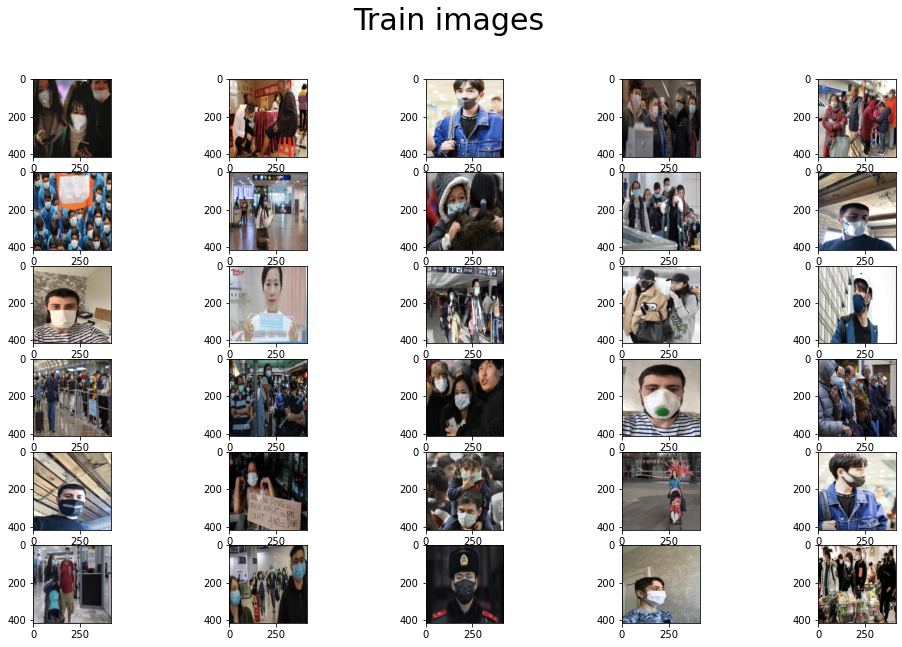

In [8]:

train_path = "/content/Mask-1/train/images/*"
val_path = "/content/Mask-1/valid/images/*"
test_path = "/content/Mask-1/test/images/*"

test=glob.glob(f'{test_path}')
val=glob.glob(f'{val_path}')
train = glob.glob(f'{train_path}')
trainSeg=train[:30]
fig = figure(0, (17,10))
num_cols = 5
num_rows = int(ceil(len(trainSeg)/num_cols))
for i, image in enumerate(trainSeg):
    plt.suptitle("Train images",size=30)
    im = plt.imread(image)
    fig.add_subplot(num_rows, num_cols, i+1)
    plt.imshow(im)

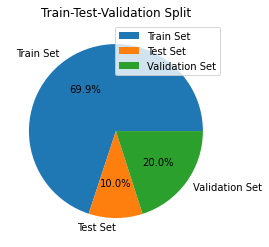

In [9]:
y = np.array([len(train), len(test),len(val)])
labels=['Train Set','Test Set','Validation Set']
plt.pie(y,labels=labels,autopct='%1.1f%%')
plt.title("Train-Test-Validation Split")
plt.legend()
plt.show()


# Step 2: Model **training**

For the project, as we menttioned earlier we will be using the [YOLOV5](https://github.com/ultralytics/yolov5) for training our data. YOLOV5 is a state-of-the-art object detcection library made on PyTorch, provides a family of object detection architectures and models pretrained on the COCO dataset. It is a powerful tool which is capable of doing object detection tasks at fast rate and with high accuracy. Morover, it addditionally has built in tools whicha allows the users to easily run their models on videos, photos and even live webcam. The library seems the perfect fit for our ptoject. So lets go ahead and import YOLOV5 !

   **Loading the YOLOV5 model**

In [10]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 10064, done.
remote: Counting objects: 100% (21/21), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 10064 (delta 11), reused 16 (delta 8), pack-reused 10043
Receiving objects: 100% (10064/10064), 10.36 MiB | 24.62 MiB/s, done.
Resolving deltas: 100% (6981/6981), done.


In [11]:
### change the dir to dyolov5
%cd yolov5

/content/yolov5


In [12]:
### install all requirements

!pip install -r requirements.txt

YOLO v5 Model has a lot of pre-trained weights, for our model we are downloading and using YOLOV5 small. Let's start the training part....

In [23]:
!python train.py --img 416 --batch 8 --epochs 50 --data /content/Mask-1/data.yaml --weights /content/yolov5/yolov5s.pt --nosave --cache

train: weights=/content/yolov5/yolov5s.pt, cfg=, data=/content/Mask-1/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=50, batch_size=8, imgsz=416, rect=False, resume=False, nosave=True, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-111-g94d8fec torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, tra

#Stage 3: Testing and Inference Phase

In [24]:
!python detect.py --source /content/Mask-1/test/images --weights /content/yolov5/runs/train/exp8/weights/best.pt 

detect: weights=['/content/yolov5/runs/train/exp8/weights/best.pt'], source=/content/Mask-1/test/images, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-111-g94d8fec torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/85 /content/Mask-1/test/images/maksssksksss102_png.rf.da069c6784fc73a4ac11f943de7b1eb7.jpg: 640x640 2 with_masks, Done. (0.034s)
image 2/85 /content/Mask-1/test/images/maksssksksss108_png.rf.4d8fd15a76a3359e09156ff5f6e3f067.jpg: 640x640 7 with_masks, 1 without_mask, Done. (0.033s)
image 3/85 /content/Mask-1/test/images/maksssksksss123_png.rf.47fd5e71db582c871360

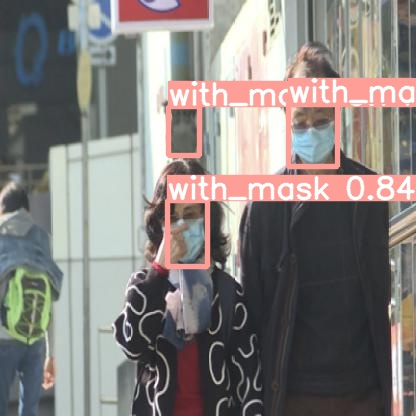

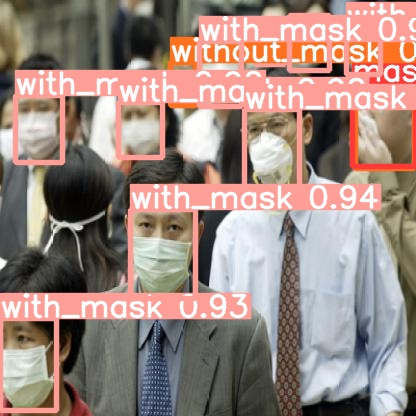

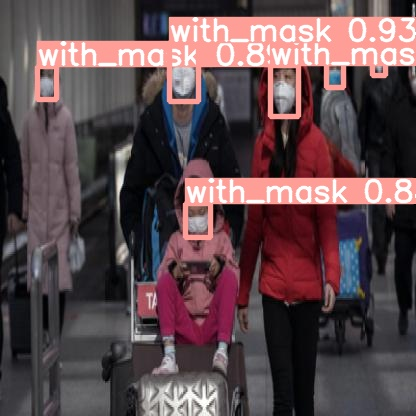

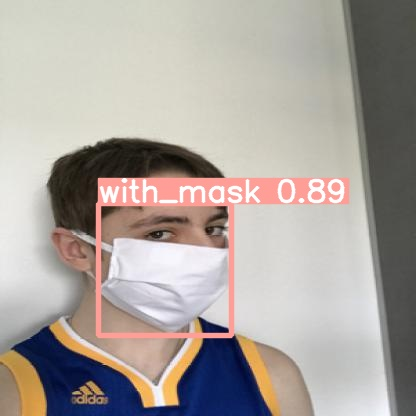

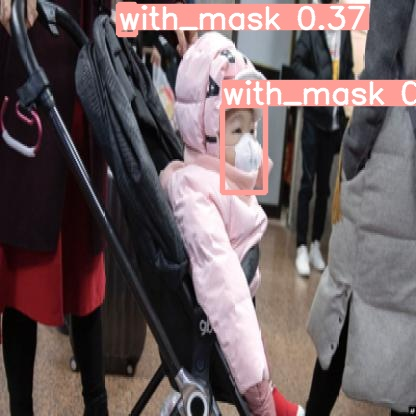

...

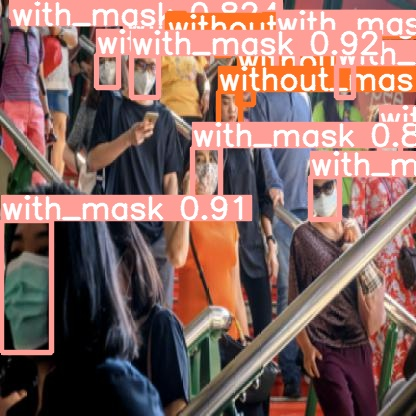

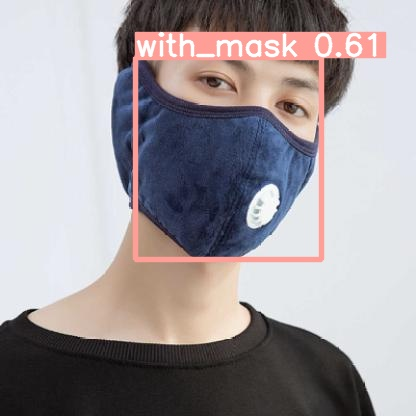

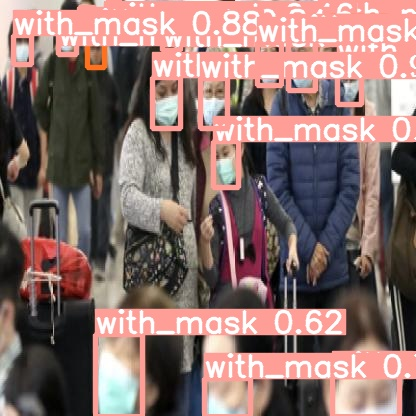

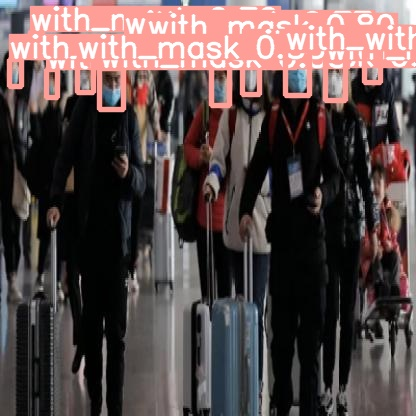

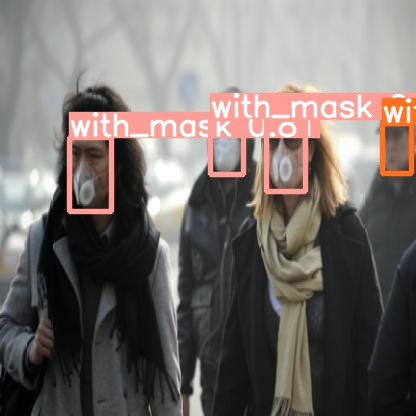

In [28]:
#display result images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp5/*.jpg'): #assuming JPG
    display(Image(filename=imageName))

Let's use tensorboard to visualize our data

In [26]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

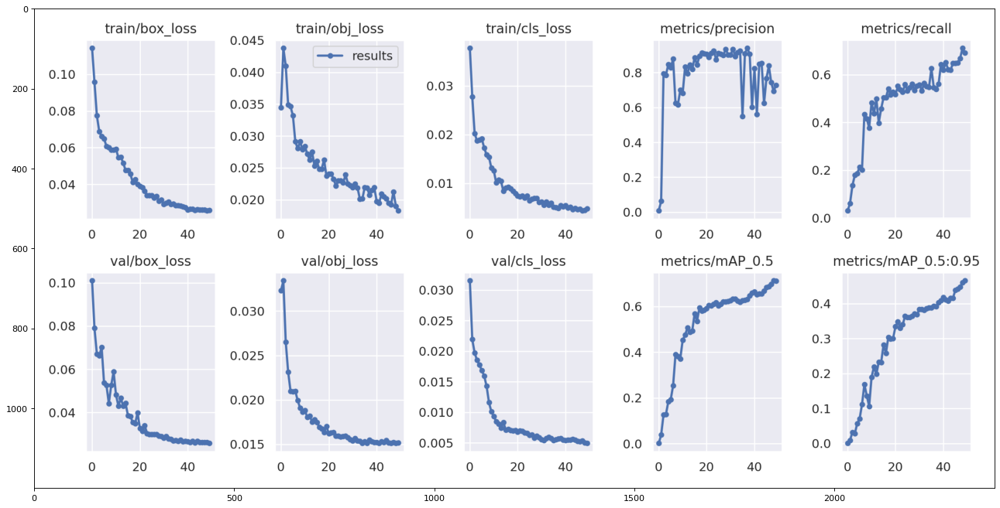

In [27]:
import cv2

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.pyplot import figure

figure(figsize=(20, 20), dpi=80)
plt.imshow(mpimg.imread('/content/yolov5/runs/train/exp8/results.png'))

# Result and final thoughts

As we can see from the above results, we have obtained a good performance adna re able to detect accuartely whether a person is wearing a mask correctly or not, but the model is not always, but sometimes struggling to detect if a mask is worn incorrectly or not. But inspite of this we are can say that the model is still working good as it is fast and providing consistent real time results. For deployment purposes, the model can be fed into an API to create a functioning webapp using frameworks like Flask to give output in real time.